In [1]:
import numpy as np
from numpy import expand_dims
from keras.models import load_model
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
from matplotlib import pyplot
from matplotlib.patches import Rectangle

Using TensorFlow backend.


In [2]:
class BoundBox:
    def __init__(self, xmin, ymin, xmax, ymax, objness = None, classes = None):
        self.xmin = xmin
        self.ymin = ymin
        self.xmax = xmax
        self.ymax = ymax
        self.objness = objness
        self.classes = classes
        self.label = -1
        self.score = -1
 
    def get_label(self):
        if self.label == -1:
            self.label = np.argmax(self.classes)
 
        return self.label
 
    def get_score(self):
        if self.score == -1:
            self.score = self.classes[self.get_label()]
 
        return self.score

In [3]:
def _sigmoid(x):
    return 1. / (1. + np.exp(-x))

In [4]:
def decode_netout(netout, anchors, obj_thresh, net_h, net_w):
    grid_h, grid_w = netout.shape[:2]
    nb_box = 3
    netout = netout.reshape((grid_h, grid_w, nb_box, -1))
    nb_class = netout.shape[-1] - 5
    boxes = []
    netout[..., :2]  = _sigmoid(netout[..., :2])
    netout[..., 4:]  = _sigmoid(netout[..., 4:])
    netout[..., 5:]  = netout[..., 4][..., np.newaxis] * netout[..., 5:]
    netout[..., 5:] *= netout[..., 5:] > obj_thresh
 
    for i in range(grid_h*grid_w):
        row = i / grid_w
        col = i % grid_w
        for b in range(nb_box):
            # 4th element is objectness score
            objectness = netout[int(row)][int(col)][b][4]
            if(objectness.all() <= obj_thresh): continue
            # first 4 elements are x, y, w, and h
            x, y, w, h = netout[int(row)][int(col)][b][:4]
            x = (col + x) / grid_w # center position, unit: image width
            y = (row + y) / grid_h # center position, unit: image height
            w = anchors[2 * b + 0] * np.exp(w) / net_w # unit: image width
            h = anchors[2 * b + 1] * np.exp(h) / net_h # unit: image height
            # last elements are class probabilities
            classes = netout[int(row)][col][b][5:]
            box = BoundBox(x-w/2, y-h/2, x+w/2, y+h/2, objectness, classes)
            boxes.append(box)
    return boxes

In [5]:
def correct_yolo_boxes(boxes, image_h, image_w, net_h, net_w):
    new_w, new_h = net_w, net_h
    for i in range(len(boxes)):
        x_offset, x_scale = (net_w - new_w)/2./net_w, float(new_w)/net_w
        y_offset, y_scale = (net_h - new_h)/2./net_h, float(new_h)/net_h
        boxes[i].xmin = int((boxes[i].xmin - x_offset) / x_scale * image_w)
        boxes[i].xmax = int((boxes[i].xmax - x_offset) / x_scale * image_w)
        boxes[i].ymin = int((boxes[i].ymin - y_offset) / y_scale * image_h)
        boxes[i].ymax = int((boxes[i].ymax - y_offset) / y_scale * image_h)

In [6]:
def _interval_overlap(interval_a, interval_b):
    x1, x2 = interval_a
    x3, x4 = interval_b
    if x3 < x1:
        if x4 < x1:
            return 0
        else:
            return min(x2,x4) - x1
    else:
        if x2 < x3:
             return 0
        else:
            return min(x2,x4) - x3

In [7]:
def bbox_iou(box1, box2):
    intersect_w = _interval_overlap([box1.xmin, box1.xmax], [box2.xmin, box2.xmax])
    intersect_h = _interval_overlap([box1.ymin, box1.ymax], [box2.ymin, box2.ymax])
    intersect = intersect_w * intersect_h
    w1, h1 = box1.xmax-box1.xmin, box1.ymax-box1.ymin
    w2, h2 = box2.xmax-box2.xmin, box2.ymax-box2.ymin
    union = w1*h1 + w2*h2 - intersect
    return float(intersect) / union

In [8]:
def do_nms(boxes, nms_thresh):
    if len(boxes) > 0:
        nb_class = len(boxes[0].classes)
    else:
        return
    for c in range(nb_class):
        sorted_indices = np.argsort([-box.classes[c] for box in boxes])
        for i in range(len(sorted_indices)):
            index_i = sorted_indices[i]
            if boxes[index_i].classes[c] == 0: continue
            for j in range(i+1, len(sorted_indices)):
                index_j = sorted_indices[j]
                if bbox_iou(boxes[index_i], boxes[index_j]) >= nms_thresh:
                    boxes[index_j].classes[c] = 0

In [9]:
# load and prepare an image
def load_image_pixels(filename, shape):
    # load the image to get its shape
    image = load_img(filename)
    width, height = image.size
    # load the image with the required size
    image = load_img(filename, target_size=shape)
    # convert to numpy array
    image = img_to_array(image)
    # scale pixel values to [0, 1]
    image = image.astype('float32')
    image /= 255.0
    # add a dimension so that we have one sample
    image = expand_dims(image, 0)
    return image, width, height

In [10]:
# get all of the results above a threshold
def get_boxes(boxes, labels, thresh):
    v_boxes, v_labels, v_scores = list(), list(), list()
    # enumerate all boxes
    for box in boxes:
        # enumerate all possible labels
        for i in range(len(labels)):
            # check if the threshold for this label is high enough
            if box.classes[i] > thresh:
                v_boxes.append(box)
                v_labels.append(labels[i])
                v_scores.append(box.classes[i]*100)
                # don't break, many labels may trigger for one box
    return v_boxes, v_labels, v_scores

In [11]:
# draw all results
def draw_boxes(filename, v_boxes, v_labels, v_scores):
    # load the image
    data = pyplot.imread(filename)
    # plot the image
    pyplot.imshow(data)
    # get the context for drawing boxes
    ax = pyplot.gca()
    # plot each box
    for i in range(len(v_boxes)):
        box = v_boxes[i]
        # get coordinates
        y1, x1, y2, x2 = box.ymin, box.xmin, box.ymax, box.xmax
        # calculate width and height of the box
        width, height = x2 - x1, y2 - y1
        # create the shape
        rect = Rectangle((x1, y1), width, height, fill=False, color='white')
        # draw the box
        ax.add_patch(rect)
        # draw text and score in top left corner
        label = "%s (%.3f)" % (v_labels[i], v_scores[i])
        pyplot.text(x1, y1, label, color='white')
    # show the plot
    pyplot.show()

In [12]:
# define the labels
labels = ["person", "bicycle", "car", "motorbike", "aeroplane", "bus", "train", "truck",
    "boat", "traffic light", "fire hydrant", "stop sign", "parking meter", "bench",
    "bird", "cat", "dog", "horse", "sheep", "cow", "elephant", "bear", "zebra", "giraffe",
    "backpack", "umbrella", "handbag", "tie", "suitcase", "frisbee", "skis", "snowboard",
    "sports ball", "kite", "baseball bat", "baseball glove", "skateboard", "surfboard",
    "tennis racket", "bottle", "wine glass", "cup", "fork", "knife", "spoon", "bowl", "banana",
    "apple", "sandwich", "orange", "broccoli", "carrot", "hot dog", "pizza", "donut", "cake",
    "chair", "sofa", "pottedplant", "bed", "diningtable", "toilet", "tvmonitor", "laptop", "mouse",
    "remote", "keyboard", "cell phone", "microwave", "oven", "toaster", "sink", "refrigerator",
    "book", "clock", "vase", "scissors", "teddy bear", "hair drier", "toothbrush"]

C:\Users\Anaconda_python\lib\site-packages\keras\engine\saving.py:341: UserWarning: No training configuration found in save file: the model was *not* compiled. Compile it manually.
  warnings.warn('No training configuration found in save file: '


[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 99.95604157447815


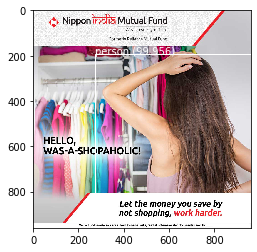

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 98.49048852920532
laptop 99.8754620552063


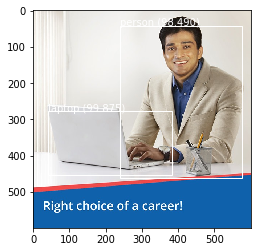

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 99.98726844787598


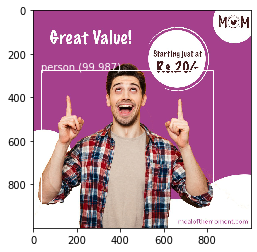

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
bottle 64.51466083526611
bottle 77.25117206573486
bottle 60.48157215118408
bottle 74.15839433670044
cup 60.2583110332489
cup 68.53999495506287
cup 77.41824388504028
bowl 73.8593578338623
bottle 80.89092373847961
bottle 68.76487135887146
cup 86.15868091583252
cup 72.94173240661621


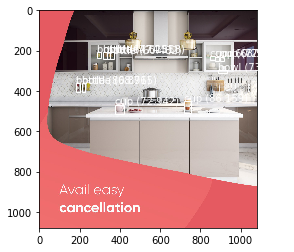

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 99.602210521698
person 92.08715558052063
person 99.95778799057007
person 99.96093511581421
person 98.59870672225952
tie 98.65736365318298
tie 70.68631649017334
cup 75.84059834480286
cup 95.17890810966492
cup 90.84417819976807


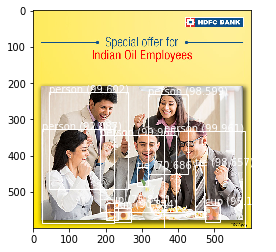

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


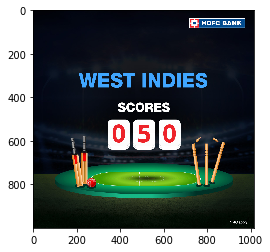

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 66.28447771072388
person 98.67843985557556
person 91.86248779296875
person 99.04107451438904
sofa 62.188005447387695
person 78.08138132095337
person 98.54623675346375
bowl 60.10670065879822


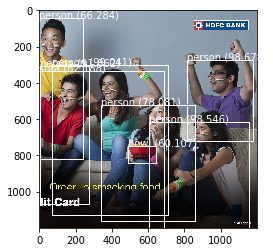

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


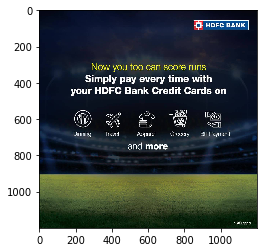

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 65.84214568138123


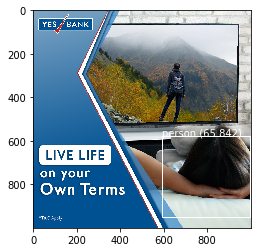

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 99.01335835456848


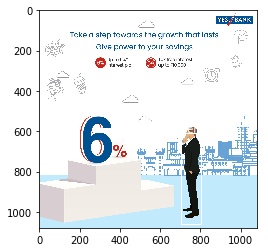

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
laptop 79.12864685058594
person 99.88747835159302
spoon 74.005788564682


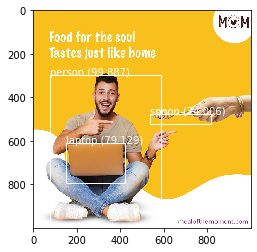

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 93.37930083274841
person 99.8438835144043
person 99.5989441871643
person 99.39396381378174
person 91.74051880836487
person 96.29603624343872


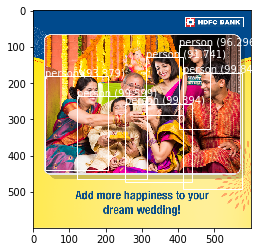

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


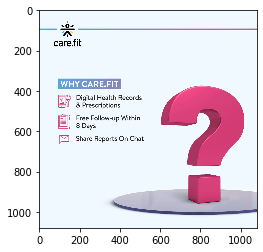

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


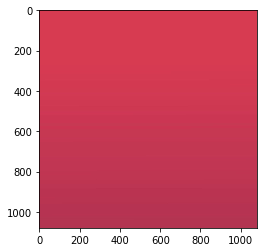

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


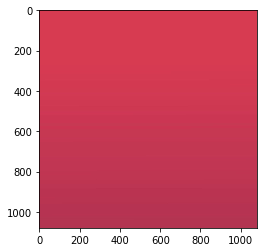

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 99.59288835525513


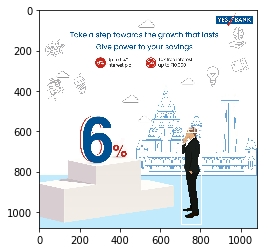

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 97.05138206481934
bird 60.292160511016846
bird 64.15659785270691
bird 61.394304037094116


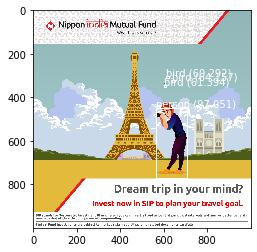

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 99.64250922203064
sports ball 74.50281381607056


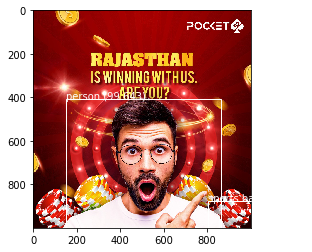

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
motorbike 98.56484532356262
person 80.48906922340393


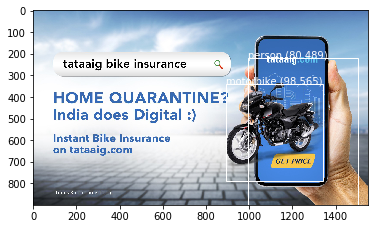

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


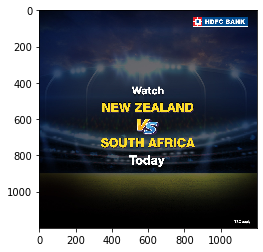

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
bottle 73.95938038825989


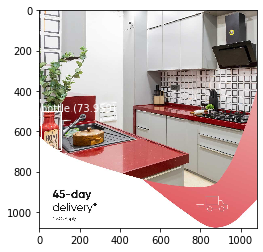

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
bowl 98.67115616798401
diningtable 93.17641258239746
bottle 92.99352765083313
broccoli 76.17902755737305
bottle 99.76385235786438
bottle 99.91044998168945


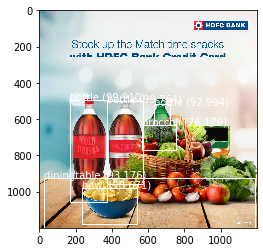

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 96.77573442459106


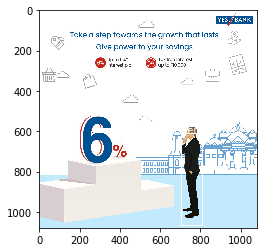

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


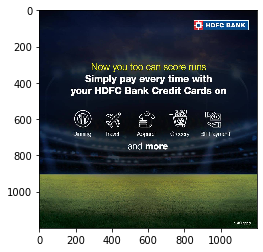

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


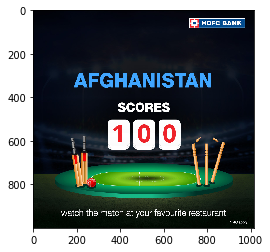

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


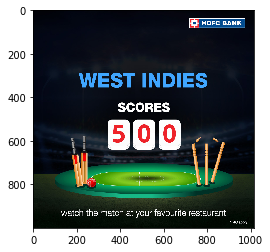

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
tvmonitor 81.8680465221405
person 86.58429384231567
diningtable 75.44605731964111
chair 66.02857112884521
person 95.60589790344238
person 93.20394992828369
person 86.33137941360474
bowl 61.74889802932739
cup 75.92664361000061
apple 62.44330406188965


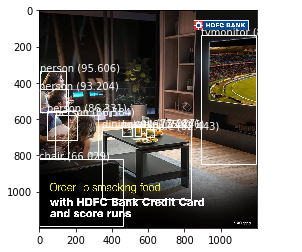

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 97.58285284042358


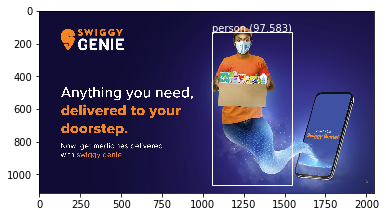

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
motorbike 99.80614185333252


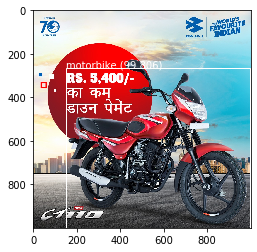

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


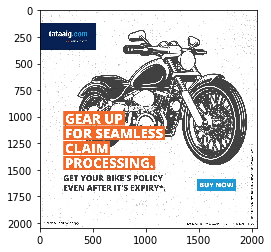

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
sofa 63.54430913925171
person 98.3705997467041


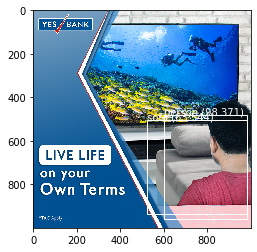

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


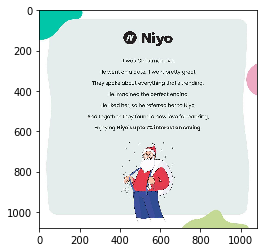

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


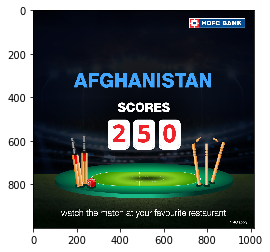

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


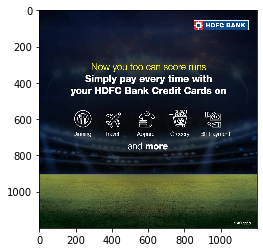

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


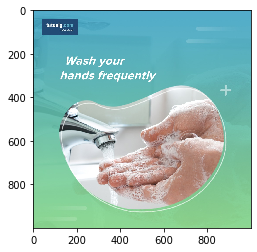

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


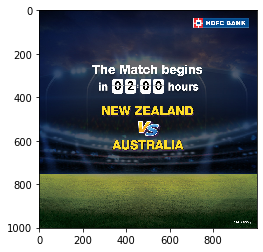

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


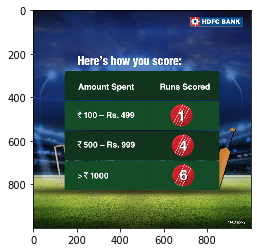

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
bowl 70.21352052688599
bowl 89.7457480430603


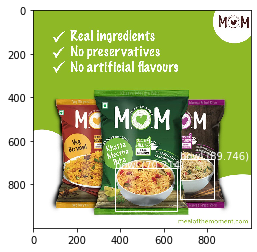

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


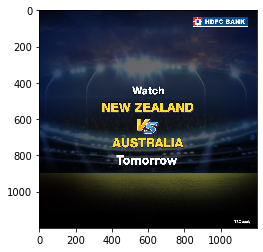

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
bowl 99.10635948181152
diningtable 94.02881860733032
bottle 93.58062148094177
broccoli 73.069167137146
bottle 99.78161454200745
bottle 99.90098476409912


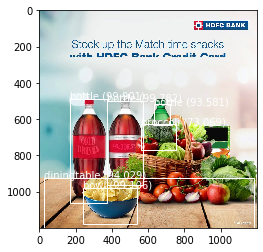

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 98.45638871192932
person 94.77710723876953
person 91.95042252540588


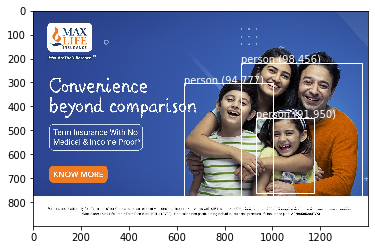

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
motorbike 99.96749758720398
person 99.74741339683533


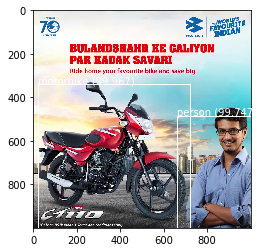

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


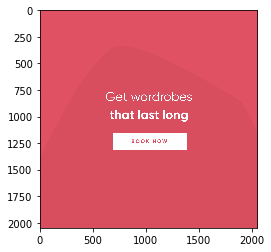

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 99.82468485832214


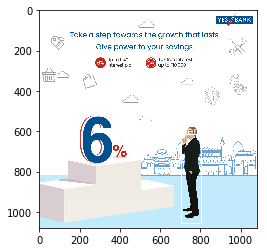

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 99.34850335121155
person 63.02832365036011


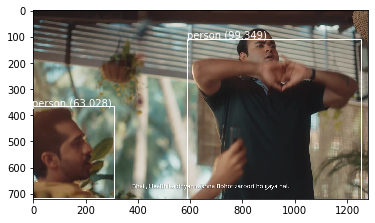

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 92.56420731544495
diningtable 85.12868285179138
chair 77.69554257392883
person 95.49402594566345
pottedplant 75.60617327690125
person 93.84015202522278
person 63.49737048149109
cup 75.72011351585388


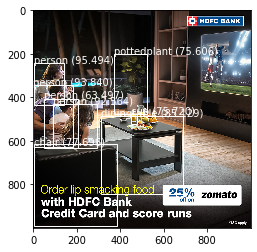

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 99.958735704422


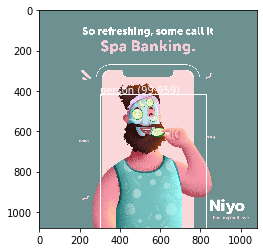

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


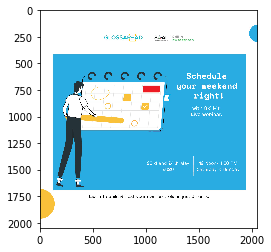

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
broccoli 92.32964515686035


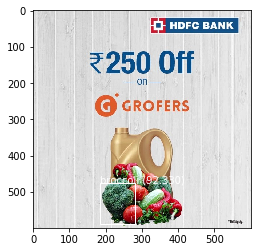

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


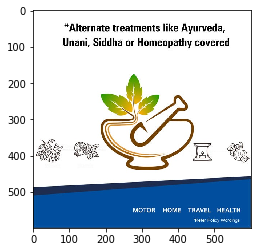

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


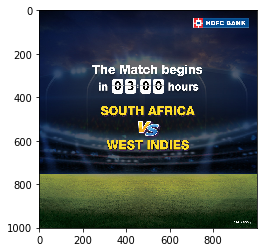

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 99.62277412414551


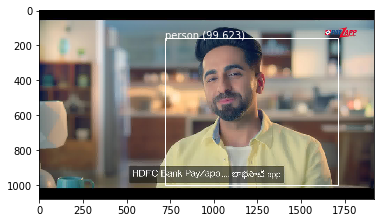

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


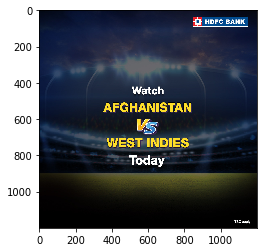

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


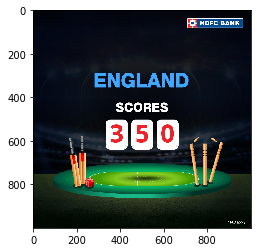

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


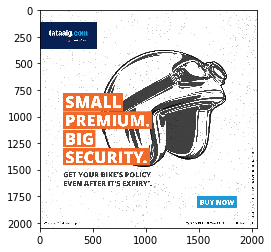

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


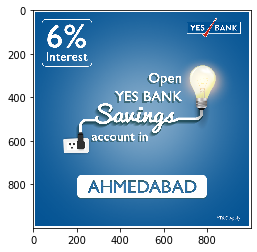

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
bowl 99.02101755142212
diningtable 91.02017879486084
bottle 91.570645570755
broccoli 73.8959550857544
bottle 99.87476468086243
bottle 99.92918968200684


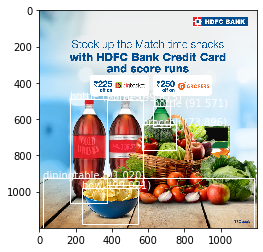

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 99.79784488677979


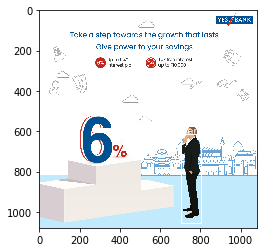

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
chair 89.31675553321838
chair 65.51724076271057


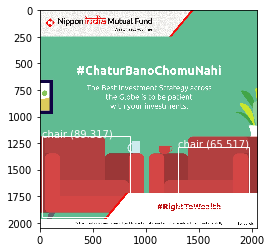

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 99.5543360710144
frisbee 83.97016525268555


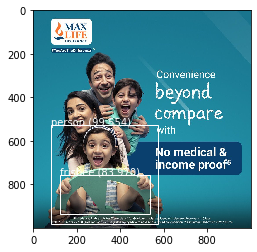

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


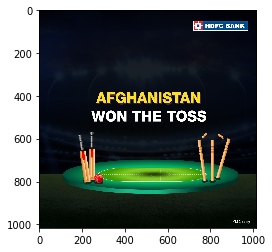

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 87.36920356750488


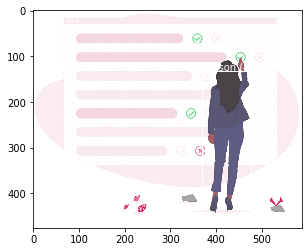

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


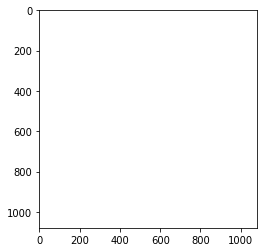

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 99.6092140674591
person 92.16198921203613
person 99.95765089988708
person 99.96132850646973
person 98.73602390289307
tie 98.65411520004272
tie 70.6884503364563
cup 75.8410394191742
cup 95.18043994903564
cup 90.84370732307434


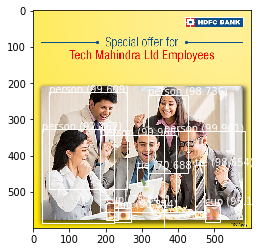

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


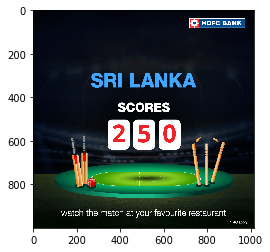

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
bowl 99.08751249313354
diningtable 94.233638048172
bottle 93.67836713790894
broccoli 75.03777146339417
bottle 99.74859952926636
bottle 99.90148544311523


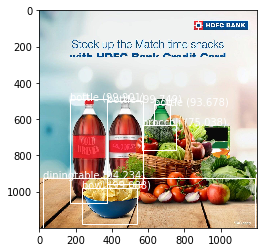

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 99.15762543678284


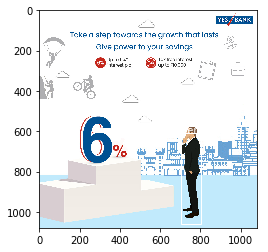

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 99.80897307395935


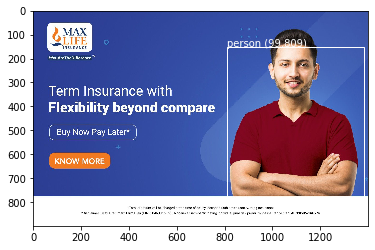

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


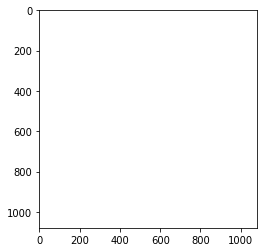

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


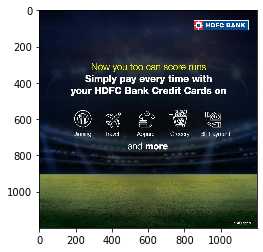

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


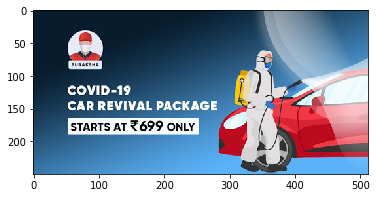

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 99.57902431488037


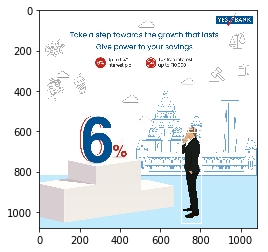

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
motorbike 99.97753500938416


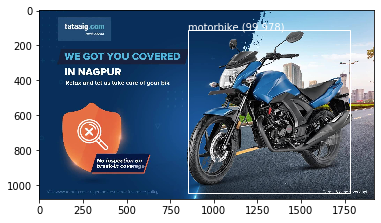

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
motorbike 99.96771216392517
person 99.75540041923523


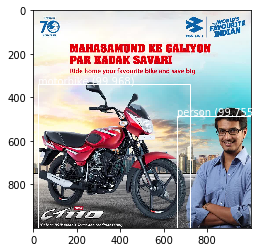

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
bowl 99.1633653640747
diningtable 93.8698947429657
bottle 93.49559545516968
broccoli 75.1994252204895
bottle 99.7291624546051
bottle 99.91316795349121


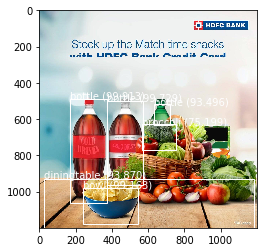

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


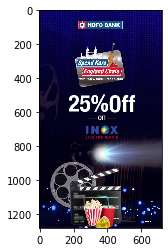

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


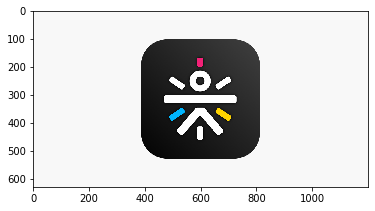

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 85.34414172172546
chair 95.14806270599365
tie 75.94006657600403


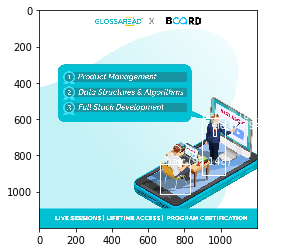

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 99.942147731781


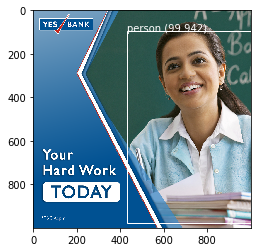

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
tvmonitor 81.42077922821045
person 87.77920007705688
diningtable 78.75662446022034
chair 71.70660495758057
person 95.20294666290283
person 91.69530272483826
person 86.97624206542969
bowl 66.55533909797668
cup 77.04184055328369
apple 61.41164302825928


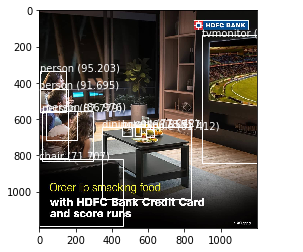

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


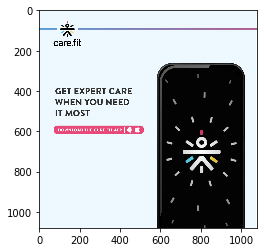

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 99.97144341468811
person 99.80581402778625


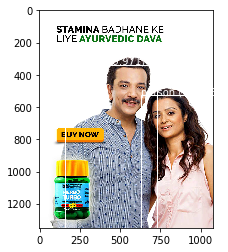

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
bowl 99.07531142234802
diningtable 93.3827817440033
bottle 93.377023935318
broccoli 77.28551626205444
bottle 99.74021911621094
bottle 99.9187171459198


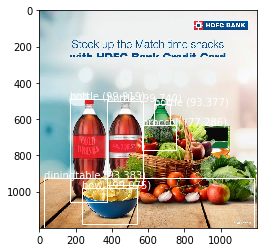

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
tvmonitor 84.45114493370056
person 87.07584738731384
diningtable 78.99079918861389
chair 76.16890072822571
person 95.18405795097351
person 92.8623616695404
person 83.18891525268555
cup 77.93208360671997


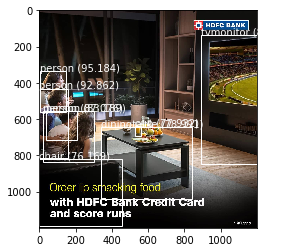

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


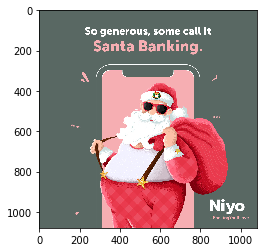

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 99.81043338775635


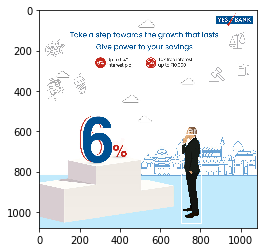

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 99.6778666973114


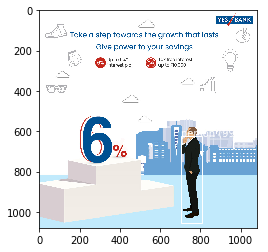

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
pottedplant 65.95298051834106
pottedplant 76.96488499641418
sink 82.59141445159912


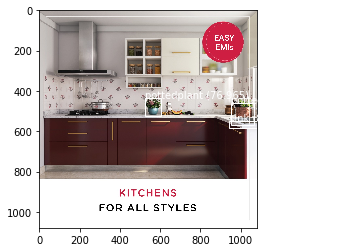

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 99.86522793769836


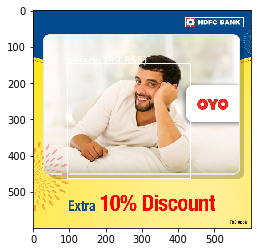

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 99.9000072479248
chair 85.48088669776917


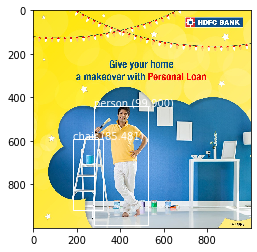

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 70.18431425094604
person 65.79977869987488
person 90.92950820922852
sports ball 95.42709589004517


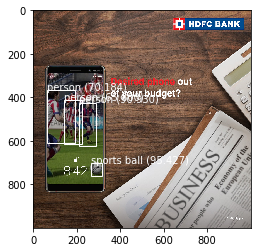

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 99.56625699996948


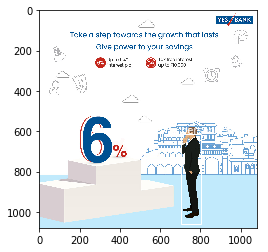

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 99.65702295303345


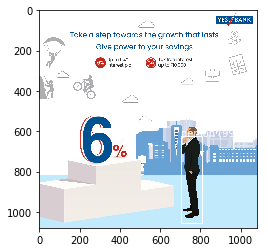

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 63.924235105514526
person 98.84231686592102
person 93.33957433700562
person 99.17666912078857
sofa 63.859474658966064
person 73.6249327659607
person 98.60695004463196
bowl 60.50931215286255


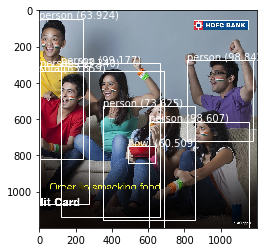

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 87.24818825721741


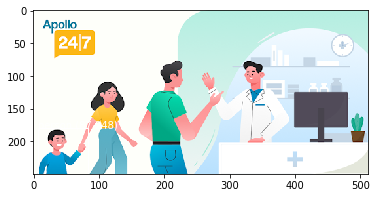

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


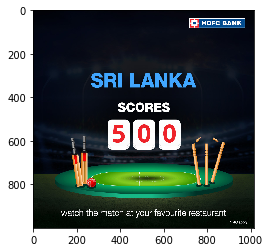

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 96.74527049064636


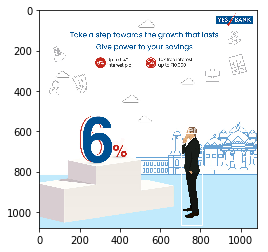

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


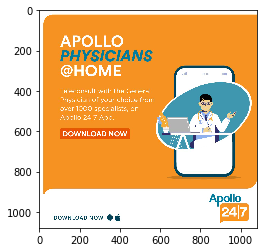

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 99.01132583618164


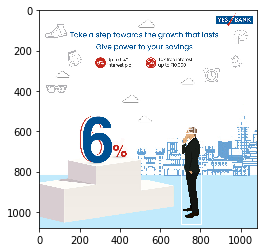

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


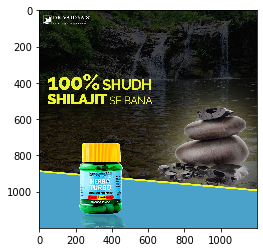

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 99.91174936294556


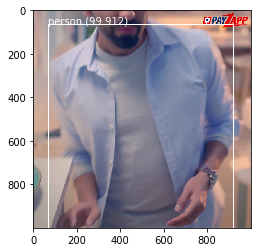

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
car 99.78251457214355


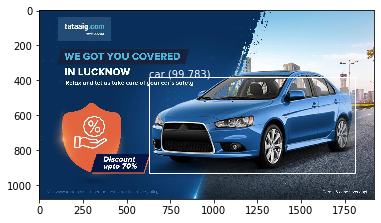

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


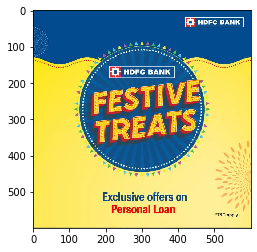

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
car 99.75438117980957


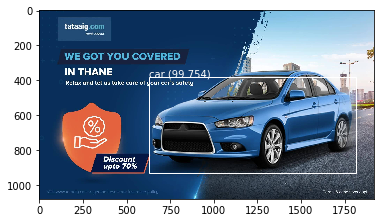

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


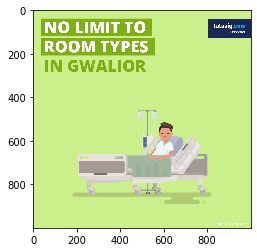

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


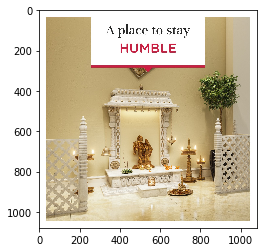

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


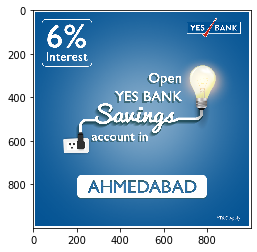

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
tvmonitor 63.191455602645874
person 98.22500348091125
person 94.12354230880737
person 99.3382453918457
chair 95.37333250045776


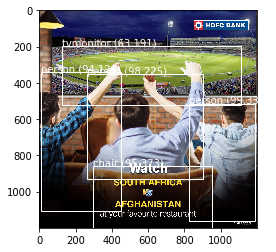

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


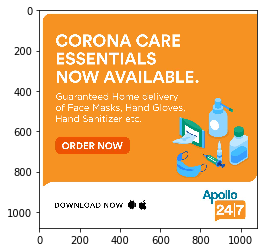

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
bowl 98.86569380760193
diningtable 93.55480074882507
bottle 92.78703927993774
broccoli 72.92732000350952
bottle 99.76702332496643
bottle 99.9198853969574


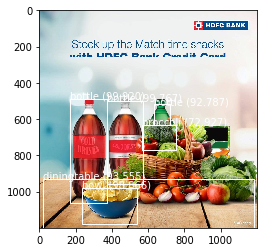

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


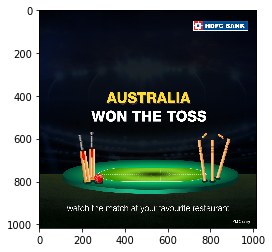

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


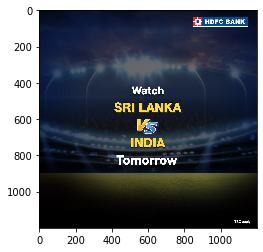

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


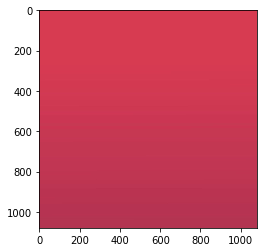

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


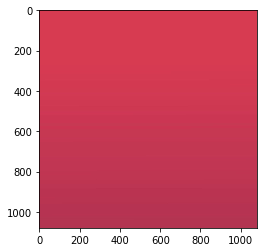

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
book 89.0964925289154
book 66.65225028991699
book 90.24107456207275
book 62.93707489967346


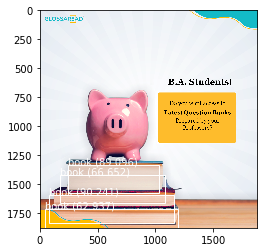

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 99.6662974357605


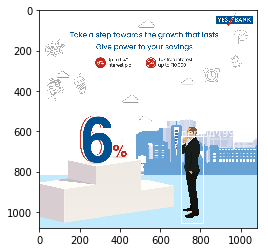

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 94.89555358886719
person 98.66213798522949


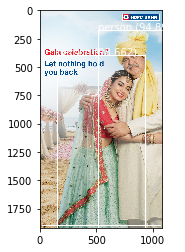

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
cell phone 71.86616063117981
person 66.35352373123169
car 99.5742917060852


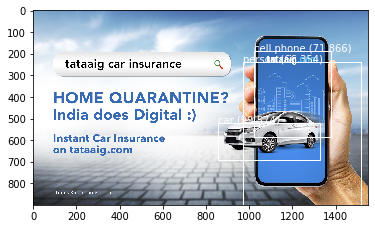

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
car 99.75586533546448


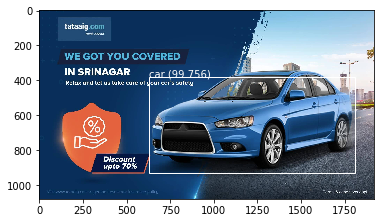

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 99.07472133636475
person 99.24582839012146
person 84.43703055381775


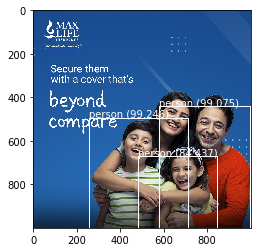

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 89.1591489315033
person 95.97006440162659
sofa 90.5202567577362
sofa 60.83801984786987


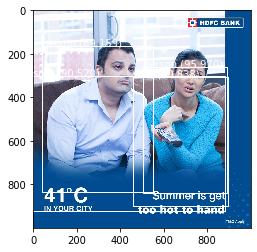

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 99.81290102005005


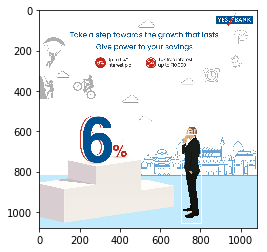

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 99.0715742111206


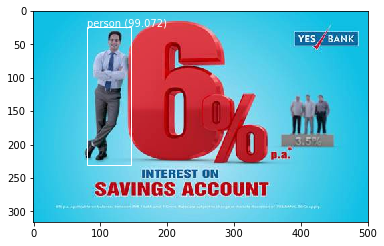

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 95.66152691841125
person 96.00564241409302
person 99.30626153945923


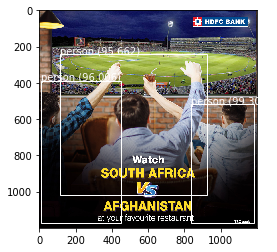

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 99.86394047737122
person 99.39789175987244
bench 90.13869762420654


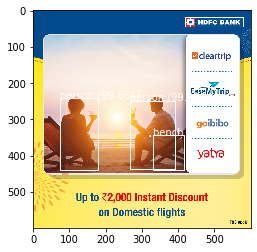

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
bowl 99.00797009468079
diningtable 93.04678440093994
bottle 92.30411052703857
broccoli 76.75307989120483
bottle 99.72111582756042
bottle 99.91307854652405


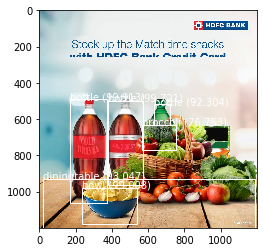

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


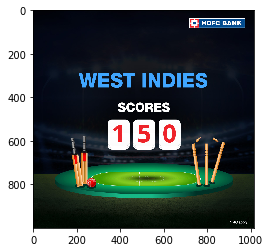

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
motorbike 99.92572665214539
person 99.2741048336029
handbag 92.0694649219513


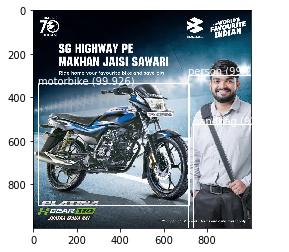

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
tvmonitor 87.01084852218628
person 85.96071600914001
diningtable 77.33482718467712
chair 73.71355295181274
person 95.41075229644775
person 91.00650548934937
person 89.84985947608948
bowl 61.373597383499146
cup 75.72777271270752
apple 63.93432021141052


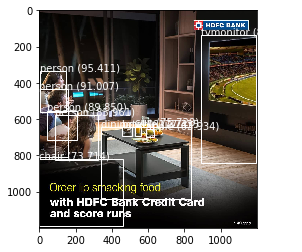

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


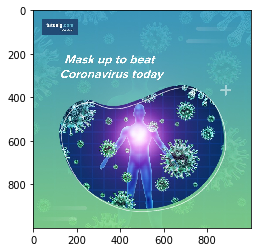

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
motorbike 99.96798634529114
person 99.75672960281372


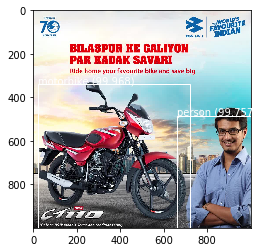

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
motorbike 99.9776542186737


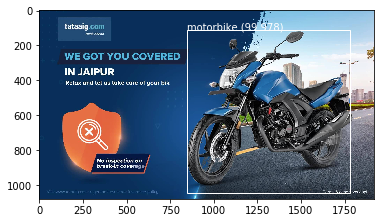

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


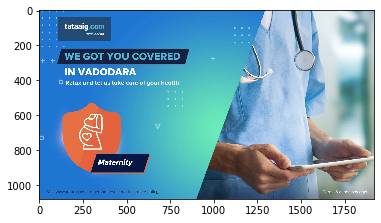

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
motorbike 99.92755055427551
person 99.26156997680664
handbag 91.52783751487732


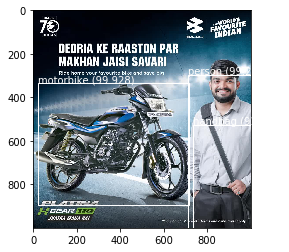

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
tvmonitor 70.32553553581238
person 99.29844737052917
person 95.05656957626343
person 99.41648244857788
chair 95.07684111595154


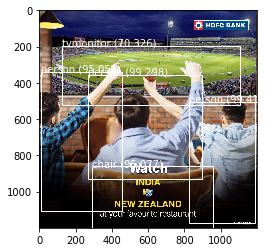

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 89.1591489315033
person 95.97006440162659
sofa 90.5202567577362
sofa 60.83801984786987


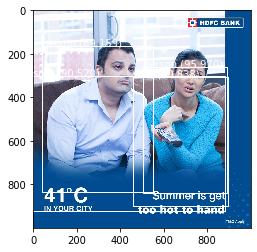

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 92.56420731544495
diningtable 85.12868285179138
chair 77.69554257392883
person 95.49402594566345
pottedplant 75.60617327690125
person 93.84015202522278
person 63.49737048149109
cup 75.72011351585388


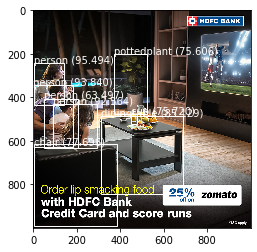

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
motorbike 99.96772408485413
person 99.75523352622986


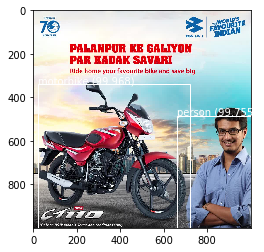

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 99.14550185203552


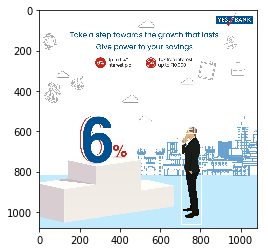

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 96.37428522109985


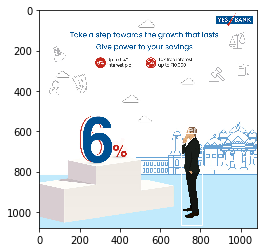

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


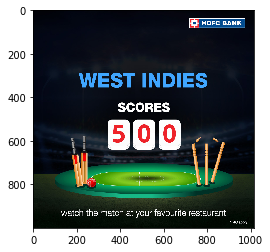

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 99.66750144958496


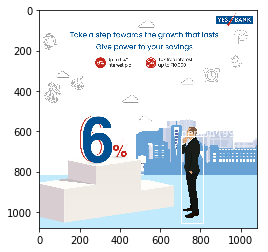

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


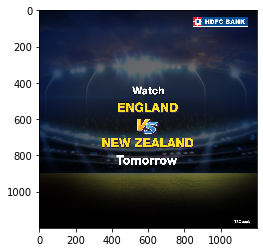

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 99.7681200504303


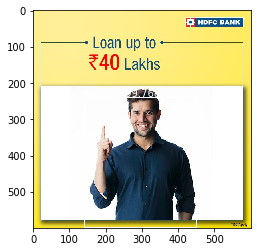

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
sofa 99.8744785785675
pottedplant 97.43425250053406


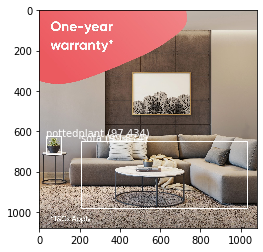

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
truck 98.96870255470276


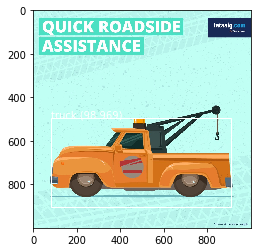

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
bowl 99.07031655311584
diningtable 93.2355523109436
bottle 93.64919066429138
broccoli 74.53535199165344
bottle 99.79212284088135
bottle 99.91875290870667


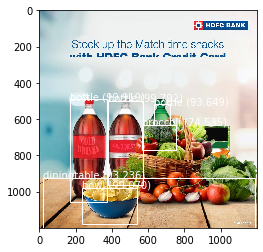

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 99.58962202072144


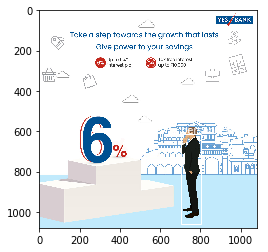

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
motorbike 93.67286562919617


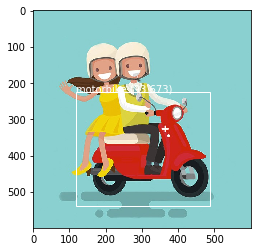

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 99.6092140674591
person 92.16198921203613
person 99.95765089988708
person 99.96132850646973
person 98.73602390289307
tie 98.65411520004272
tie 70.6884503364563
cup 75.8410394191742
cup 95.18043994903564
cup 90.84370732307434


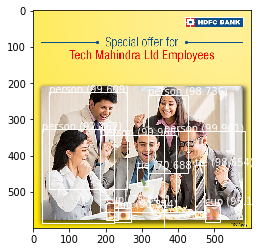

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


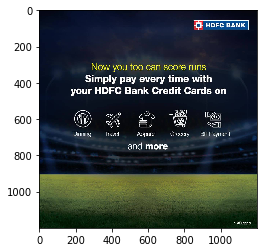

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
motorbike 99.96731877326965
person 99.75302815437317


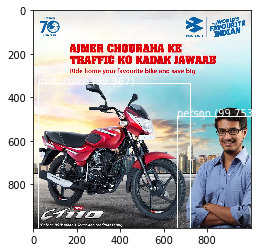

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


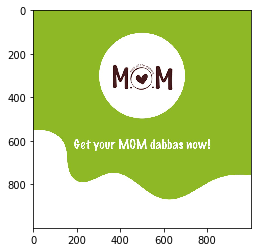

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


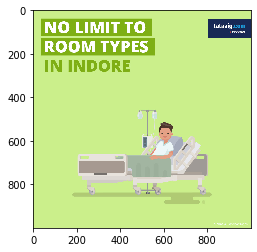

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 66.66838526725769
person 98.94435405731201
person 93.02070140838623
person 99.00144338607788
person 79.9448549747467
person 98.65728616714478
bowl 60.07072925567627


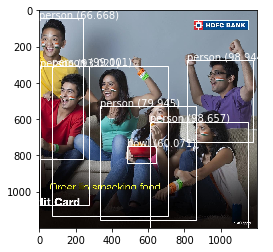

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
car 99.79064464569092


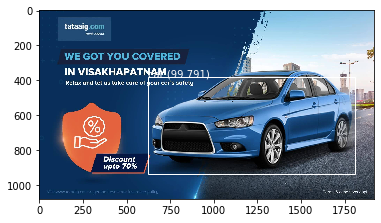

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


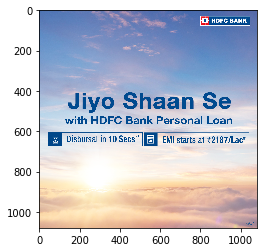

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


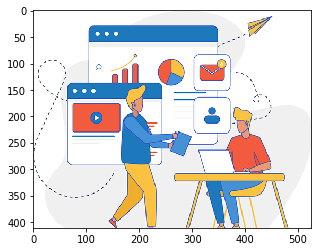

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
car 99.71320033073425


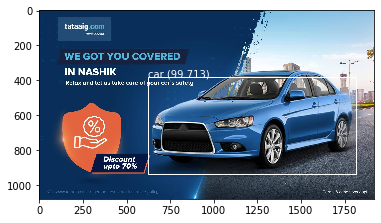

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 99.02355074882507


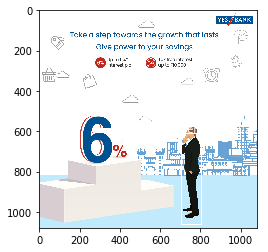

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


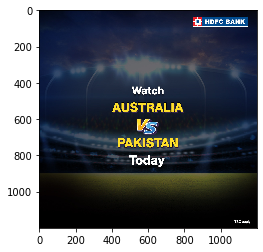

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 99.65938925743103


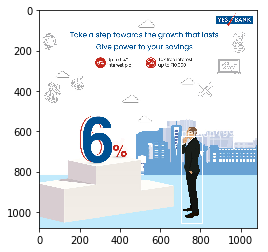

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


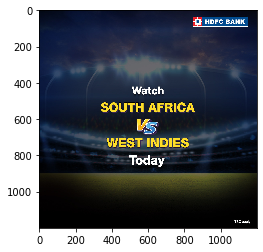

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


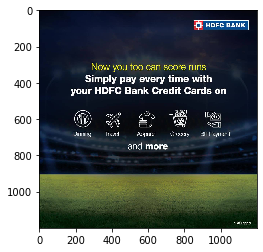

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
motorbike 99.96762871742249
person 99.75994229316711


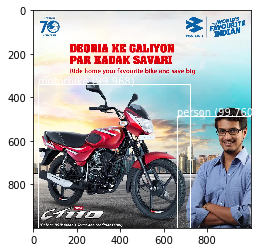

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


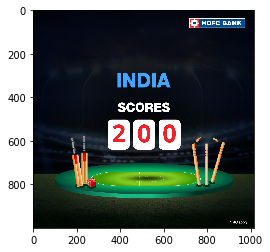

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 99.58341717720032
sports ball 74.38515424728394


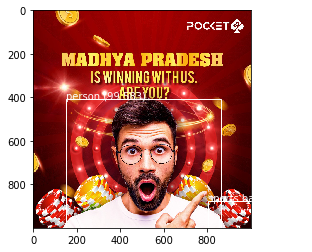

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


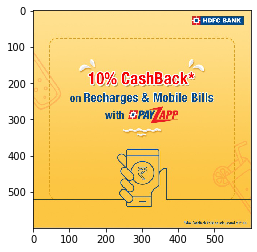

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


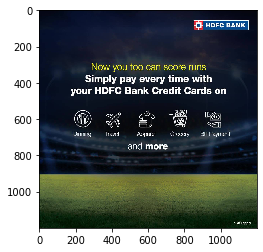

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


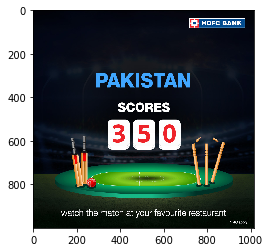

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
cup 96.89392447471619


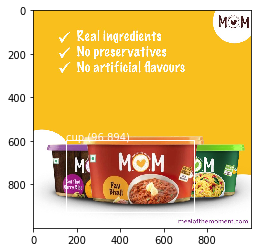

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
car 99.76423382759094


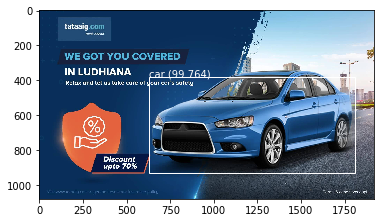

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


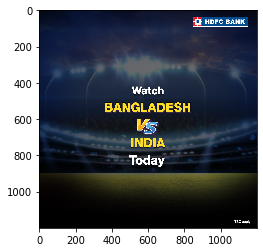

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


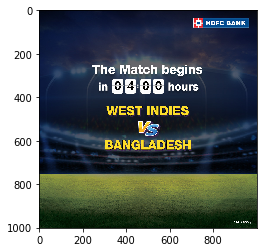

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


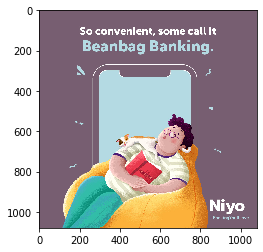

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


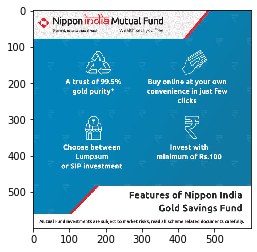

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


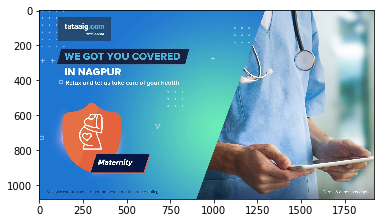

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
bowl 99.06933307647705
diningtable 94.13229823112488
bottle 92.25271344184875
broccoli 72.8655993938446
bottle 99.70647692680359
bottle 99.91254806518555


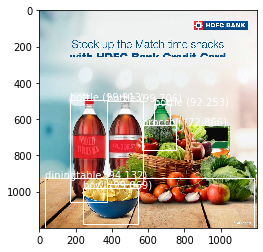

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
tvmonitor 86.66751384735107
person 88.15670609474182
diningtable 78.87771725654602
chair 66.51580929756165
person 96.429842710495
person 92.9347038269043
person 83.62197279930115
bowl 62.638819217681885
cup 79.11123037338257
apple 60.82205772399902


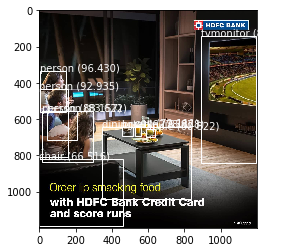

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 99.75195527076721
person 83.52723717689514


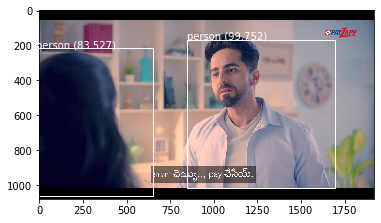

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
motorbike 99.92695450782776
person 99.27853345870972
handbag 92.99346804618835


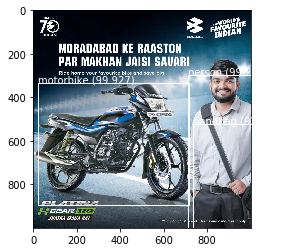

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 99.83060956001282


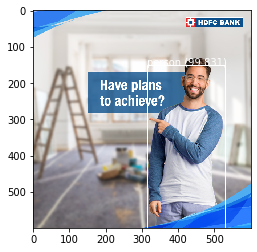

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 99.65747594833374


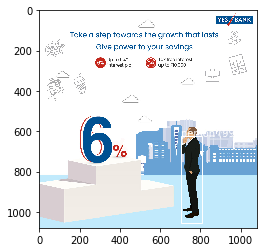

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 98.01278710365295


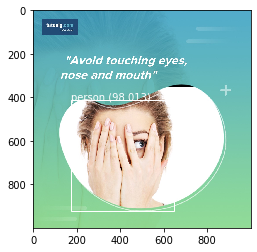

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


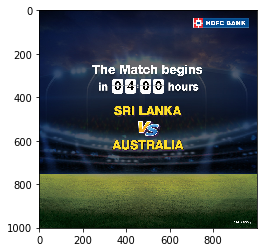

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


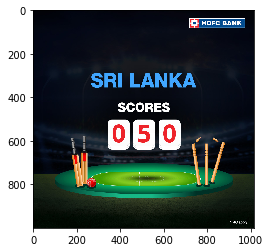

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


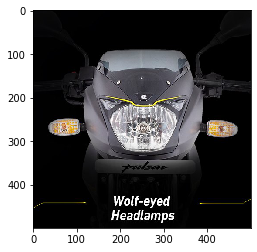

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


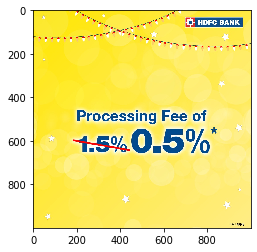

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
bowl 99.04338717460632
diningtable 94.22523379325867
bottle 93.98286938667297
broccoli 75.2318263053894
bottle 99.76486563682556
bottle 99.91227388381958


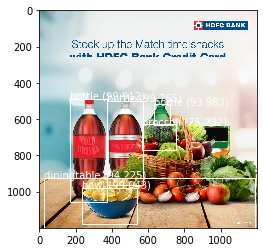

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


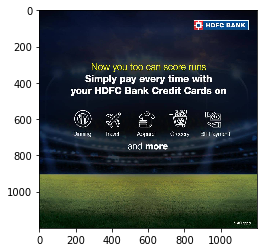

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


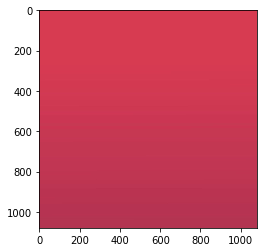

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


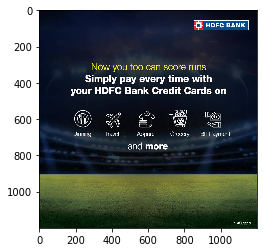

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


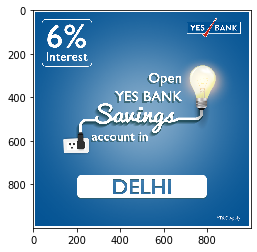

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


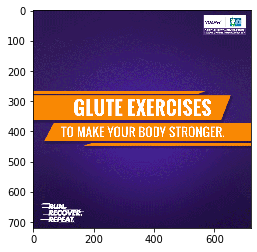

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 97.85338640213013
backpack 81.18652701377869
person 85.75366735458374


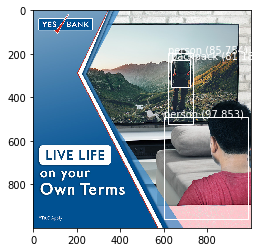

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
laptop 79.12864685058594
person 99.88747835159302
spoon 74.005788564682


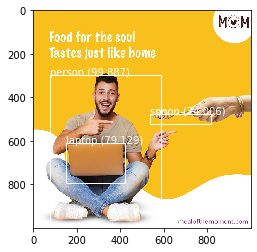

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


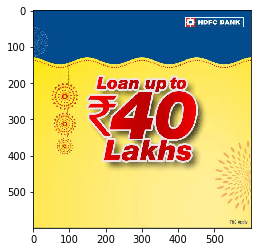

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


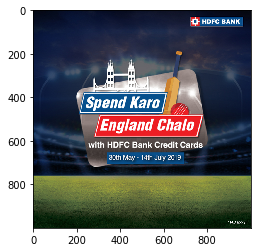

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
motorbike 99.96762871742249
person 99.75994229316711


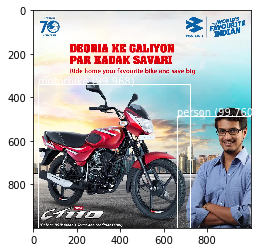

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 93.37430596351624
person 95.08564472198486
person 99.36936497688293
chair 61.32970452308655


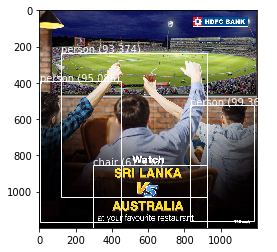

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
bowl 97.82271385192871


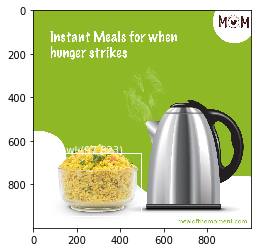

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


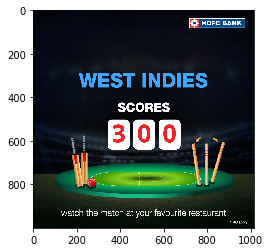

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


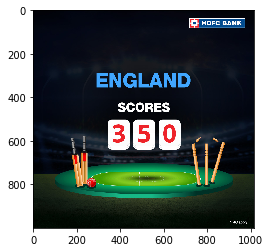

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
tvmonitor 87.41530179977417
person 85.43576002120972
diningtable 81.41179084777832
chair 71.58470749855042
person 95.55357694625854
person 93.64178776741028
person 84.84000563621521
bowl 64.92986679077148
cup 79.45985198020935
apple 61.37365698814392


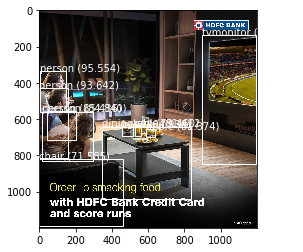

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 96.78661227226257


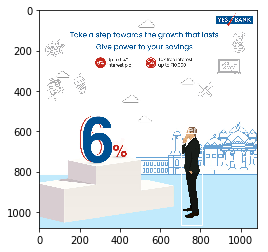

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
tvmonitor 86.40297055244446
person 85.62301397323608
diningtable 74.42777752876282
chair 70.53788304328918
person 95.7672119140625
person 92.58475303649902
person 87.41981387138367
bowl 62.841397523880005
cup 78.8657546043396
apple 64.34392929077148


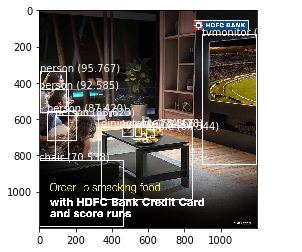

In [13]:
# load yolov3 model
#For multiple image
#For complete url sequence to load image from url, download and idntify objects in image and delete image
model = load_model('model.h5')
# define the expected input shape for the model
input_w, input_h = 416, 416
import pandas as pd
import urllib.request
import os
import random
super_object_list =[]
sub_object_list =[]
empty_object_list = []
data = pd.read_csv(r"C:\Users\Shridhar Palo\Desktop\Shrikant Patro\Assignment_Dataset\Test Sample Data for Creative Analysis object detection.csv")
url_sequence = data.iloc[:,-1]
for i in url_sequence:
    try :
        resource = urllib.request.urlopen(i)
        photo_filename = str(os.getpid())+str(random.randint(0,100000))+".jpg"
        output = open(photo_filename,"wb")
        output.write(resource.read())  
        # load and prepare image
        image, image_w, image_h = load_image_pixels(photo_filename, (input_w, input_h))
        # make prediction
        yhat = model.predict(image)
        # load and prepare image
        image, image_w, image_h = load_image_pixels(photo_filename, (input_w, input_h))
        # make prediction
        yhat = model.predict(image)
        # summarize the shape of the list of arrays
        print([a.shape for a in yhat])
        # define the anchors
        anchors = [[116,90, 156,198, 373,326], [30,61, 62,45, 59,119], [10,13, 16,30, 33,23]]
        # define the probability threshold for detected objects
        class_threshold = 0.6
        boxes = list()
        for i in range(len(yhat)):
            # decode the output of the network
            boxes += decode_netout(yhat[i][0], anchors[i], class_threshold, input_h, input_w)
        # correct the sizes of the bounding boxes for the shape of the image
        correct_yolo_boxes(boxes, image_h, image_w, input_h, input_w)
        # suppress non-maximal boxes
        do_nms(boxes, 0.5)
        # get the details of the detected objects
        v_boxes, v_labels, v_scores = get_boxes(boxes, labels, class_threshold)
        # summarize what we found
        for i in range(len(v_boxes)):
            print(v_labels[i], v_scores[i])
            sub_object_list.append(v_labels[i])
            #Append sub object list to super object list
        super_object_list.append(sub_object_list)
        # draw what we found
        draw_boxes(photo_filename, v_boxes, v_labels, v_scores)
        output.close()
        os.remove(photo_filename)
        #free sub_list
        sub_object_list = []
    except:
        sub_object_list.append(empty_object_list)
        super_object_list.append(sub_object_list)
        sub_object_list = []






In [14]:
print(len(super_object_list))
#print(super_object_list)

206


In [16]:
object_list = pd.Series(super_object_list)
data_copy = data
data_copy = pd.concat([data_copy,object_list], axis = 1)
data_copy.head()

,Object ID,Results,Cost Per Result,CTR,Creative Attachment,URL,0
0,1,29536,186,1.48,988,https://www.facebook.com/ads/image/?d=AQII31oc...,[person]
1,2,97570,280,1.90,1125,https://www.facebook.com/ads/image/?d=AQJlmbY5...,"[person, laptop]"
2,3,75089,166,1.00,3326,https://aiquire-attachments.s3.ap-south-1.amaz...,[person]
3,4,92104,111,1.97,725,https://www.facebook.com/ads/image/?d=AQL1me3x...,"[bottle, bottle, bottle, bottle, cup, cup, cup..."
4,5,60378,429,0.33,344,https://www.facebook.com/ads/image/?d=AQKAE109...,"[person, person, person, person, person, tie, ..."


In [17]:
#converting final dataframe along with the text extracted from each of the image to csv file
data_copy.to_csv(r'C:\\Users\\Shridhar Palo\\Desktop\\Shrikant Patro\\Assignment_Dataset\\Final_report_part2.csv')

In [18]:
#append object in object_list to test_object_detection.txt file to find object frequency details
for ob in object_list:
    with open('test_object_list.txt', 'a') as f:
        print(ob, file=f)

In [19]:
for ob in object_list:
    print(ob)

['person']
['person', 'laptop']
['person']
['bottle', 'bottle', 'bottle', 'bottle', 'cup', 'cup', 'cup', 'bowl', 'bottle', 'bottle', 'cup', 'cup']
['person', 'person', 'person', 'person', 'person', 'tie', 'tie', 'cup', 'cup', 'cup']
[]
['person', 'person', 'person', 'person', 'sofa', 'person', 'person', 'bowl']
[]
['person']
['person']
['laptop', 'person', 'spoon']
['person', 'person', 'person', 'person', 'person', 'person']
[]
[]
[]
['person']
['person', 'bird', 'bird', 'bird']
['person', 'sports ball']
['motorbike', 'person']
[]
['bottle']
['bowl', 'diningtable', 'bottle', 'broccoli', 'bottle', 'bottle']
['person']
[]
[]
[]
['tvmonitor', 'person', 'diningtable', 'chair', 'person', 'person', 'person', 'bowl', 'cup', 'apple']
['person']
['motorbike']
[]
['sofa', 'person']
[]
[]
[]
[]
[]
[]
['bowl', 'bowl']
[]
['bowl', 'diningtable', 'bottle', 'broccoli', 'bottle', 'bottle']
['person', 'person', 'person']
['motorbike', 'person']
[]
['person']
['person', 'person']
['person', 'diningtable

In [20]:
#reading the object from File
object_details = open('test_object_list.txt', 'r')
obj = object_details.read()
print(obj)

['person']
['person', 'laptop']
['person']
['bottle', 'bottle', 'bottle', 'bottle', 'cup', 'cup', 'cup', 'bowl', 'bottle', 'bottle', 'cup', 'cup']
['person', 'person', 'person', 'person', 'person', 'tie', 'tie', 'cup', 'cup', 'cup']
[]
['person', 'person', 'person', 'person', 'sofa', 'person', 'person', 'bowl']
[]
['person']
['person']
['laptop', 'person', 'spoon']
['person', 'person', 'person', 'person', 'person', 'person']
[]
[]
[]
['person']
['person', 'bird', 'bird', 'bird']
['person', 'sports ball']
['motorbike', 'person']
[]
['bottle']
['bowl', 'diningtable', 'bottle', 'broccoli', 'bottle', 'bottle']
['person']
[]
[]
[]
['tvmonitor', 'person', 'diningtable', 'chair', 'person', 'person', 'person', 'bowl', 'cup', 'apple']
['person']
['motorbike']
[]
['sofa', 'person']
[]
[]
[]
[]
[]
[]
['bowl', 'bowl']
[]
['bowl', 'diningtable', 'bottle', 'broccoli', 'bottle', 'bottle']
['person', 'person', 'person']
['motorbike', 'person']
[]
['person']
['person', 'person']
['person', 'diningtable

In [31]:
#Collection of object to find frequency of objects
final_object_list = []
for item in super_object_list:
    for i in item:
        final_object_list.append(i)
print(final_object_list)

['person', 'person', 'laptop', 'person', 'bottle', 'bottle', 'bottle', 'bottle', 'cup', 'cup', 'cup', 'bowl', 'bottle', 'bottle', 'cup', 'cup', 'person', 'person', 'person', 'person', 'person', 'tie', 'tie', 'cup', 'cup', 'cup', 'person', 'person', 'person', 'person', 'sofa', 'person', 'person', 'bowl', 'person', 'person', 'laptop', 'person', 'spoon', 'person', 'person', 'person', 'person', 'person', 'person', 'person', 'person', 'bird', 'bird', 'bird', 'person', 'sports ball', 'motorbike', 'person', 'bottle', 'bowl', 'diningtable', 'bottle', 'broccoli', 'bottle', 'bottle', 'person', 'tvmonitor', 'person', 'diningtable', 'chair', 'person', 'person', 'person', 'bowl', 'cup', 'apple', 'person', 'motorbike', 'sofa', 'person', 'bowl', 'bowl', 'bowl', 'diningtable', 'bottle', 'broccoli', 'bottle', 'bottle', 'person', 'person', 'person', 'motorbike', 'person', 'person', 'person', 'person', 'person', 'diningtable', 'chair', 'person', 'pottedplant', 'person', 'person', 'cup', 'person', 'brocco

In [33]:
#Finding the frequency of the object in the list
freq={}
for item in final_object_list:
    if (item in freq):
        freq[item] += 1
    else :
        freq[item] = 1

for key, value in freq.items():
    print("{}:{}".format(key,value))

person:173
laptop:3
bottle:40
cup:24
bowl:24
tie:7
sofa:8
spoon:2
bird:3
sports ball:3
motorbike:15
diningtable:20
broccoli:12
tvmonitor:9
chair:16
apple:6
pottedplant:5
frisbee:1
sink:1
car:7
book:4
cell phone:1
bench:1
handbag:3
truck:1
backpack:1


In [34]:
#Sorting the dictionary
from operator import itemgetter
from collections import OrderedDict
sorted_object_x = OrderedDict(sorted(freq.items(), key=itemgetter(1)))

In [35]:
print(sorted_object_x)

OrderedDict([('frisbee', 1), ('sink', 1), ('cell phone', 1), ('bench', 1), ('truck', 1), ('backpack', 1), ('spoon', 2), ('laptop', 3), ('bird', 3), ('sports ball', 3), ('handbag', 3), ('book', 4), ('pottedplant', 5), ('apple', 6), ('tie', 7), ('car', 7), ('sofa', 8), ('tvmonitor', 9), ('broccoli', 12), ('motorbike', 15), ('chair', 16), ('diningtable', 20), ('cup', 24), ('bowl', 24), ('bottle', 40), ('person', 173)])


In [38]:
#print the lenght of the object list
print("length of sorted words")
print(len(sorted_object_x))
#Printing Top 5 most appearing objects
print("the most frequently appearing keyword")
c = 0
for i in sorted_object_x:
    c +=1
    if (c>=len(sorted_object_x)-5 and c<=len(sorted_object_x)):
        print(i)

length of sorted words
26
the most frequently appearing keyword
chair
diningtable
cup
bowl
bottle
person
